In [30]:
import os
import glob
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import sys
import seaborn as sns 
import time
from scipy.signal import find_peaks
from importlib import reload
import logging
reload(logging)
logging.basicConfig(level=logging.INFO)
import l1canalysis.miscellaneous.find_mean_inc_angle
reload(l1canalysis.miscellaneous.find_mean_inc_angle)
from l1canalysis.miscellaneous.find_mean_inc_angle import find_mean_incidence_angle
from l1canalysis.miscellaneous.wind_inversion_functions import cmod5n_forward


# 0) define analysis parameters

In [27]:
my_pola = 'VV'
acquisitions_pola = "1SDV"
burst_family = 'intraburst'
base_path = '/home/datawork-cersat-public/project/sarwave/data/products/developments/L1C_csv/SLC/IW/B07'
base_path = '/home1/scratch/agrouaze/l1c_converted/B07full_with_ccpc/'

# 1) loading the dataframes & merging into one single dataframe

### Here, the data is for all Sentinel1-A+B L1C_4.1 and L1C_B07 version files 

In [30]:
import l1canalysis.utils
reload(l1canalysis.utils)

df_s1a,df_s1b = l1canalysis.utils.load_and_merge_dataframes(base_path,pola_acqui=acquisitions_pola,
                                                pola_chosen=my_pola,burst_type_pattern = burst_family,test=False)
display(df_s1b)

INFO:root:config path: /home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/config.yml
INFO:root:safe_pattern : S1A_IW_XSP__1SDV_*.SAFE/


number of SAFE files : 20239
number of csv files : 59909
number of not empty csv : 59909
loading time : 1033.7746620178223 s


INFO:root:safe_pattern : S1B_IW_XSP__1SDV_*.SAFE/


number of SAFE files : 10354
number of csv files : 30315
number of not empty csv : 30315
loading time : 502.22346353530884 s


,sigma0_filt,incidence,nesz,ground_heading,land_flag,uwnd,vwnd,U10,V10,normalized_variance_filt,...,macs_Re_lambda_max=175.0,macs_Im_lambda_max=200.0,macs_Re_lambda_max=200.0,macs_Im_lambda_max=225.0,macs_Re_lambda_max=225.0,macs_Im_lambda_max=250.0,macs_Re_lambda_max=250.0,macs_Im_lambda_max=275.0,macs_Re_lambda_max=275.0,file_path
5,0.019016,44.251266,0.000985,-170.225680,False,NaN,NaN,-8.654320,1.940691,1.089346,...,0.017434,-0.002830,0.017805,-0.002393,0.018384,-0.002933,0.019116,-0.003051,0.019655,/home/datawork-cersat-public/project/sarwave/d...
7,0.021915,45.165215,0.001739,-170.309340,False,NaN,NaN,-10.120634,2.467500,1.077153,...,0.015398,0.002732,0.015858,0.002943,0.016111,0.002709,0.016569,0.002657,0.016858,/home/datawork-cersat-public/project/sarwave/d...
73,0.007754,37.076466,0.002163,-169.106410,False,-1.716626,-3.585383,-0.658505,-3.485436,1.120337,...,0.020363,-0.003337,0.021480,-0.003403,0.022615,-0.003686,0.022955,-0.003807,0.024573,/home/datawork-cersat-public/project/sarwave/d...
75,0.005587,38.159580,0.001540,-169.160870,False,-1.774989,-3.449747,-0.788555,-3.434064,1.132405,...,0.019224,0.001431,0.020604,0.000927,0.021965,0.001152,0.023541,0.001503,0.024237,/home/datawork-cersat-public/project/sarwave/d...
77,0.005010,39.217876,0.001384,-169.215330,False,-1.774748,-3.332459,-0.934760,-3.282396,1.123516,...,0.019302,-0.000068,0.020592,-0.000109,0.021827,0.000076,0.022714,0.000486,0.024233,/home/datawork-cersat-public/project/sarwave/d...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2389087,0.039101,31.994250,0.003453,-11.107030,False,NaN,NaN,8.982676,-2.139895,1.283471,...,0.065292,0.005168,0.067017,0.005096,0.068564,0.004606,0.070920,0.004373,0.072807,/home/datawork-cersat-public/project/sarwave/d...
2389119,0.068522,37.105267,0.002449,-10.901594,False,NaN,NaN,4.783191,6.019217,1.209493,...,0.135979,-0.011726,0.137906,-0.011763,0.141172,-0.012739,0.144369,-0.012706,0.145907,/home/datawork-cersat-public/project/sarwave/d...
2389121,0.128987,38.188230,0.001751,-10.848723,False,NaN,NaN,3.348859,6.061980,1.200968,...,0.187884,-0.014355,0.191906,-0.014236,0.194926,-0.014261,0.196442,-0.014338,0.199532,/home/datawork-cersat-public/project/sarwave/d...
2389123,0.095392,39.246370,0.001577,-10.795827,False,NaN,NaN,3.184432,6.071176,1.115955,...,0.035080,0.000241,0.037655,0.000082,0.040079,-0.000035,0.041373,-0.000870,0.044515,/home/datawork-cersat-public/project/sarwave/d...


### Add ancillary variables to the dataframes

In [31]:
import aar
reload(aar)
import l1canalysis.utils
reload(l1canalysis.utils)
df_s1a,df_s1b = l1canalysis.utils.add_ancillary_variables(df_s1a,df_s1b)

INFO:root:config path: /home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/config.yml
INFO:root:test180
INFO:root:test180


aar version
aar version


### save a temporary pickle file with the prepared dataset to save time

In [32]:
import pickle
f_temporary = '/home1/scratch/agrouaze/temporary_df_iw_l1c_macs_ccpc.pkl'
fid = open(f_temporary,'wb')
pickle.dump({'df_s1a':df_s1a,'df_s1b':df_s1b},fid)
fid.close()
print(f_temporary)

/home1/scratch/agrouaze/temporary_df_iw_l1c_macs_ccpc.pkl


### load the pickle if necessary

In [1]:
import pickle
f_temporary = '/home1/scratch/agrouaze/temporary_df_iw_l1c_macs_ccpc.pkl'
fid = open(f_temporary,'rb')
tmpdata = pickle.load(fid)
fid.close()
df_s1a = tmpdata['df_s1a']
df_s1b = tmpdata['df_s1b']

### merge S1A and S1B

In [3]:
import pandas as pd
dfs = {'S1A':df_s1a,'S1B':df_s1b}
df_s1 = pd.concat([df_s1a, df_s1b], ignore_index=True)

# 2) Analysis preparation

## 2.1) Wind speed histogram S1A/B

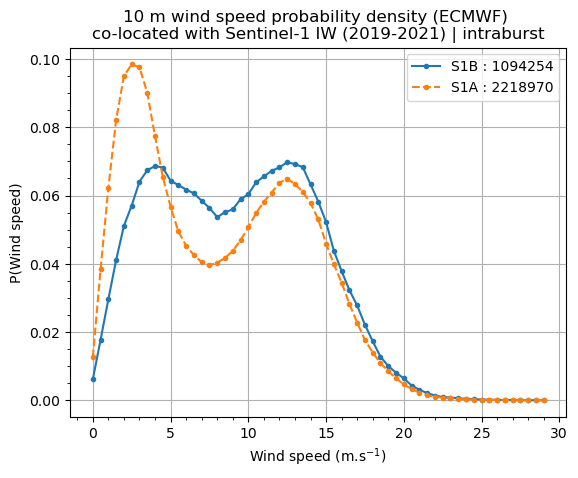

In [3]:
# plt.hist(wnd_spd_s1b, bins=80, width=.42, density=True)
bins = np.arange(0,30,0.5)
hval,_ = np.histogram(df_s1b['Wspeed'],bins,density=True)
plt.plot(bins[0:-1],hval,'.-',label='S1B : %i'%len(df_s1b['Wspeed']))
hval,_ = np.histogram(df_s1a['Wspeed'],bins,density=True)
plt.plot(bins[0:-1],hval,'.--',label='S1A : %i'%len(df_s1a['Wspeed']))
#plt.hist(wnd_spd_s1a, bins=80, width=.42, density=True)
plt.xlabel('Wind speed (m.s$^{-1}$)')
plt.ylabel('P(Wind speed)')

plt.title('10 m wind speed probability density (ECMWF) \nco-located with Sentinel-1 IW (2019-2021) | intraburst') 
#plt.title('10m wind speed probability density (ECMWF) \nSentinel-1A (2019-2024) | intraburst') 

plt.minorticks_on()
plt.grid(True)
plt.legend()
#plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/intra/S1A/wspd_histo_s1a_intra.png')
# plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/intra/S1B/wspd_histo_s1b_intra.png')
plt.show()

### histogram wind azimuth

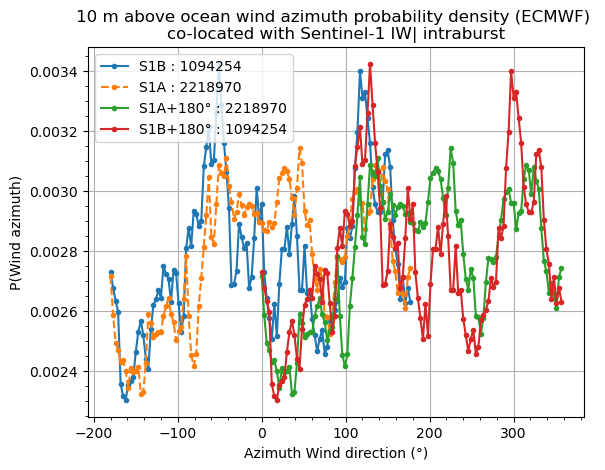

In [6]:
bins = 120
hval,binsreal = np.histogram(df_s1b['wdir_az'],bins,density=True)
plt.plot(binsreal[0:-1],hval,'.-',label='S1B : %i'%len(df_s1b['wdir_az']))



hval,_ = np.histogram(df_s1a['wdir_az'],bins,density=True)
plt.plot(binsreal[0:-1],hval,'.--',label='S1A : %i'%len(df_s1a['wdir_az']))

if True:
    hval,binsreal = np.histogram(df_s1a['wdir_az_scat'],bins,density=True)
    plt.plot(binsreal[0:-1],hval,'.-',label='S1A+180° : %i'%len(df_s1a['wdir_az_scat']))
    hval,binsreal = np.histogram(df_s1b['wdir_az_scat'],bins,density=True)
    plt.plot(binsreal[0:-1],hval,'.-',label='S1B+180° : %i'%len(df_s1b['wdir_az_scat']))
#plt.hist(wnd_spd_s1a, bins=80, width=.42, density=True)
plt.xlabel('Azimuth Wind direction (°)')
plt.ylabel('P(Wind azimuth)')

plt.title('10 m above ocean wind azimuth probability density (ECMWF) \nco-located with Sentinel-1 IW| %s'%burst_family) 
#plt.title('10m wind speed probability density (ECMWF) \nSentinel-1A (2019-2024) | intraburst') 

plt.minorticks_on()
plt.grid(True)
plt.legend()
#plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/intra/S1A/wspd_histo_s1a_intra.png')
# plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/intra/S1B/wspd_histo_s1b_intra.png')
plt.show()

## 2.2) Hs / period histogram

In [9]:
# see notebook macs_modulation_wrt_lambda.ipynb or selectiopn

## 2.3) verification plots : azimutal modulation of IMACS & s0 around 15m/s and 40° of incidence

/home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/MACS_figures/plot_MACS_azimuth_modulation.py:280: SyntaxWarning: invalid escape sequence '\p'
  nb_pts["S1A_descen"],
/home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/MACS_figures/plot_MACS_azimuth_modulation.py:437: SyntaxWarning: invalid escape sequence '\p'
  ax[i][j].text(0.03, 0.97, txt_str, transform=ax[i][j].transAxes, fontsize=12, verticalalignment='top',
/home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/MACS_figures/plot_MACS_azimuth_modulation.py:550: SyntaxWarning: invalid escape sequence '\p'
  if np.max(az_wdir_sel)>180:
/home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/MACS_figures/plot_MACS_azimuth_modulation.py:577: SyntaxWarning: invalid escape sequence '\I'
  axes[ind_iangle].grid(linestyle='--', color='gray', alpha=0.9)
/home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/MACS_figures/plot_MACS_azimuth_modulatio

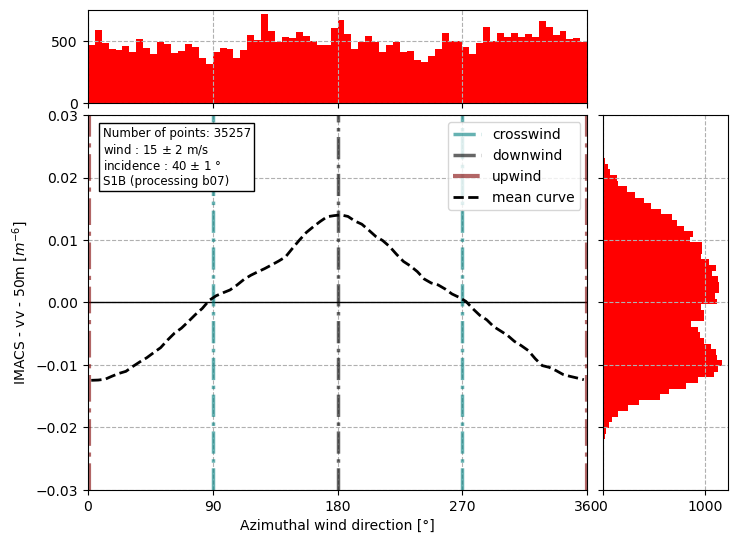

In [23]:
import l1canalysis.MACS_figures.plot_MACS_azimuth_modulation
reload(l1canalysis.MACS_figures.plot_MACS_azimuth_modulation)
# l1canalysis.MACS_figures.plot_MACS_azimuth_modulation.verification_figure(df_s1a,satellite='S1A')
l1canalysis.MACS_figures.plot_MACS_azimuth_modulation.verification_figure(df_s1b,satellite='S1B')


/home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/NRCS_figures/figures_nrcs_azimuth_modulation.py:98: SyntaxWarning: invalid escape sequence '\p'
  # azi[azi<0] = 360. - azi0[azi0<0]
INFO:root:mask_verif : 65381
INFO:root:scat azimuth


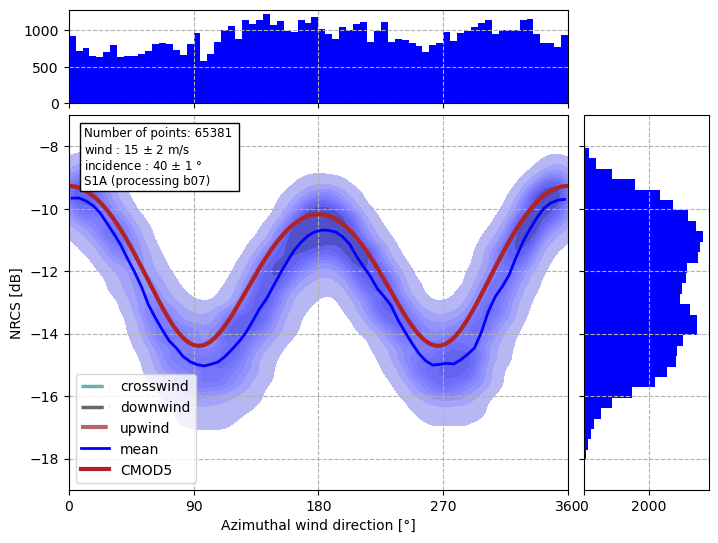

In [46]:
# from l1canalysis.NRCS_figures import figures_nrcs_azimuth_modulation
import l1canalysis.NRCS_figures.figures_nrcs_azimuth_modulation
reload(l1canalysis.NRCS_figures.figures_nrcs_azimuth_modulation)
l1canalysis.NRCS_figures.figures_nrcs_azimuth_modulation.nrcs_verification_figure(df_s1a,satellite='S1A')

# 3) IMACS mean sensors comparaison for different wind speeds & incidence angles

## 3.1) IW1 

### 3.1.1) With std 

INFO:root:config path: /home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/config.yml
/home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/MACS_figures/plot_MACS_azimuth_modulation.py:88: SyntaxWarning: invalid escape sequence '\p'
  ax_histy.hist(macs_Im_verif, bins=y_bins, color=sat_colors[satellite], orientation='horizontal')
/home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/MACS_figures/plot_MACS_azimuth_modulation.py:269: SyntaxWarning: invalid escape sequence '\p'
  ax[i][j].set_ylabel("")
/home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/MACS_figures/plot_MACS_azimuth_modulation.py:462: SyntaxWarning: invalid escape sequence '\p'
  ax[i][j].set_ylabel('%s %s - vv - %s [$m^{-6}$]'%(var_name_label,part,lambda_val), fontsize=15)
/home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/MACS_figures/plot_MACS_azimuth_modulation.py:575: SyntaxWarning: invalid escape sequence '\p'
  # az_w

Ploting time : 6.67594575881958 s


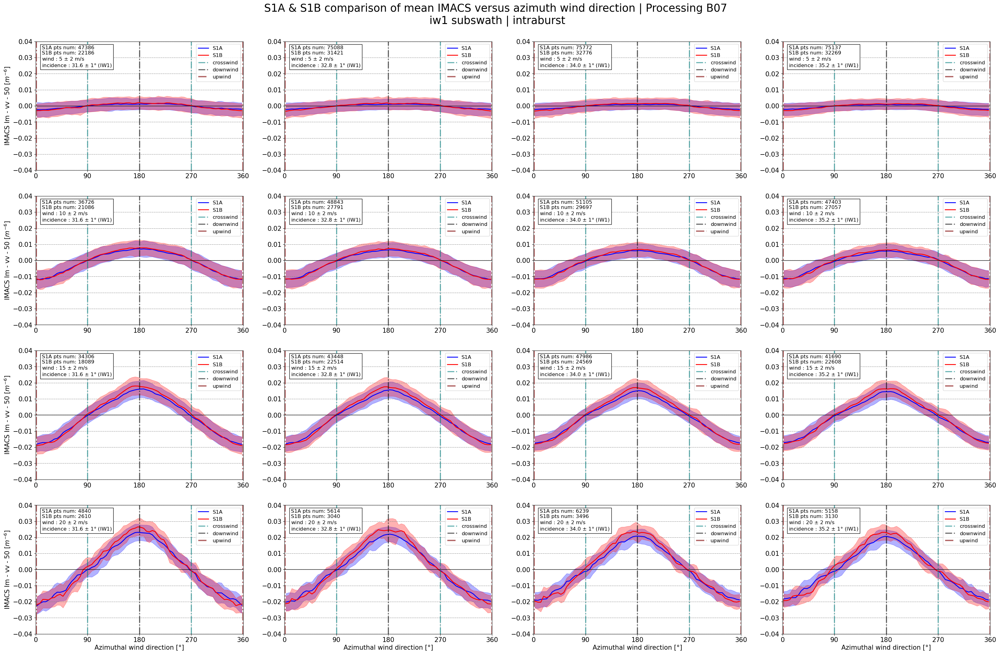

In [17]:
import l1canalysis.utils
reload(l1canalysis.utils)
import l1canalysis.MACS_figures.plot_MACS_azimuth_modulation
reload(l1canalysis.MACS_figures.plot_MACS_azimuth_modulation)

l1canalysis.MACS_figures.plot_MACS_azimuth_modulation.macs_azimutal_modulation_with_std(dfs,subswath="iw1",lambda_val='50',part="Im",
                                                                                           burstkind=burst_family)


### 3.1.2) With ascending/descending filter

INFO:root:config path: /home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/config.yml
/home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/MACS_figures/plot_MACS_azimuth_modulation.py:433: SyntaxWarning: invalid escape sequence '\p'
  ax[i][j].legend(fontsize=12, loc='upper right')
/home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/MACS_figures/plot_MACS_azimuth_modulation.py:546: SyntaxWarning: invalid escape sequence '\p'
  # bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1, imacs_ext_s1)
/home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/MACS_figures/plot_MACS_azimuth_modulation.py:573: SyntaxWarning: invalid escape sequence '\I'
  if ind_iangle == 0:
/home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/MACS_figures/plot_MACS_azimuth_modulation.py:578: SyntaxWarning: invalid escape sequence '\p'
  axes[ind_iangle].legend(fontsize=12, loc='lower center', ncols=2)
/home1/datahom

Ploting time : 8.12214994430542 s


/home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/MACS_figures/plot_MACS_azimuth_modulation.py:307: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  # fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/intra/comp_S1AB/IMACS_comp_s1ab_ascdesc_iw1_inter.png')


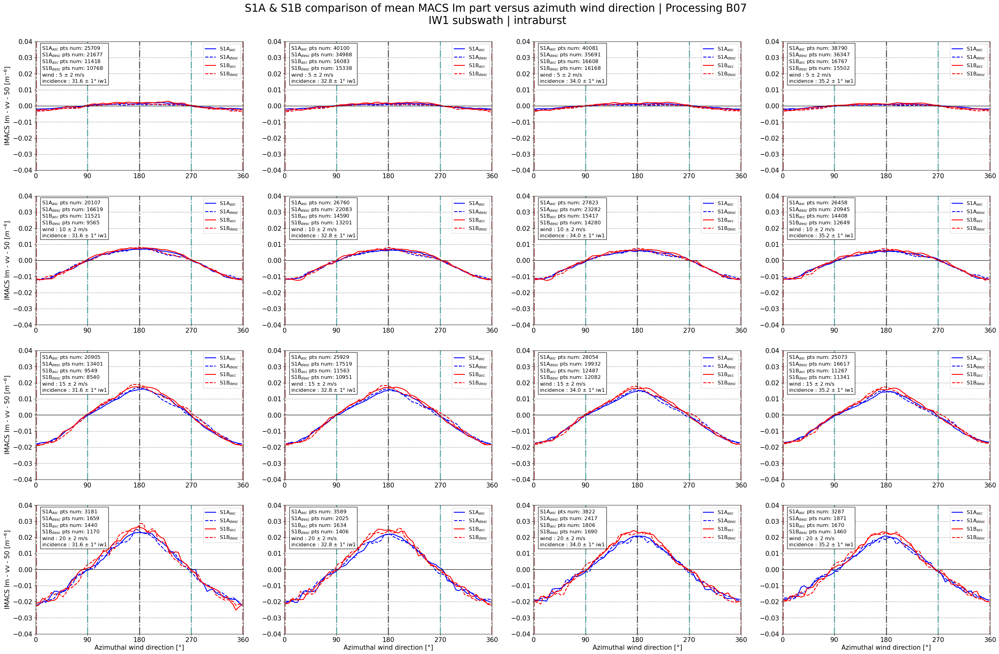

In [24]:
import l1canalysis.utils
reload(l1canalysis.utils)
import l1canalysis.MACS_figures.plot_MACS_azimuth_modulation
reload(l1canalysis.MACS_figures.plot_MACS_azimuth_modulation)

l1canalysis.MACS_figures.plot_MACS_azimuth_modulation.asc_desc_imacs_azi_modulation(dfs,subswath="iw1",lambda_val='50',part="Im",
                                                                                           burstkind=burst_family)

## 3.2) IW2 

### 3.2.1) With std

INFO:root:config path: /home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/config.yml


Ploting time : 8.781585693359375 s


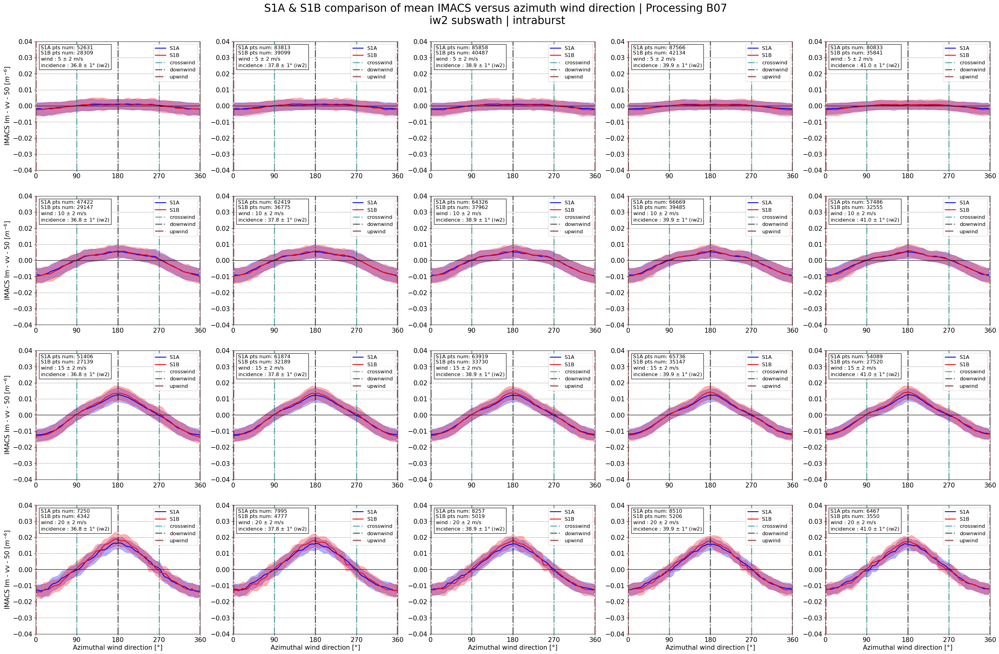

In [28]:
import l1canalysis.utils
reload(l1canalysis.utils)
import l1canalysis.MACS_figures.plot_MACS_azimuth_modulation
reload(l1canalysis.MACS_figures.plot_MACS_azimuth_modulation)

l1canalysis.MACS_figures.plot_MACS_azimuth_modulation.macs_azimutal_modulation_with_std(dfs,subswath="iw2",lambda_val='50',part="Im",
                                                                                           burstkind=burst_family)

### 3.2.2) With ascending/descending filter

INFO:root:config path: /home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/config.yml


Ploting time : 11.508689165115356 s


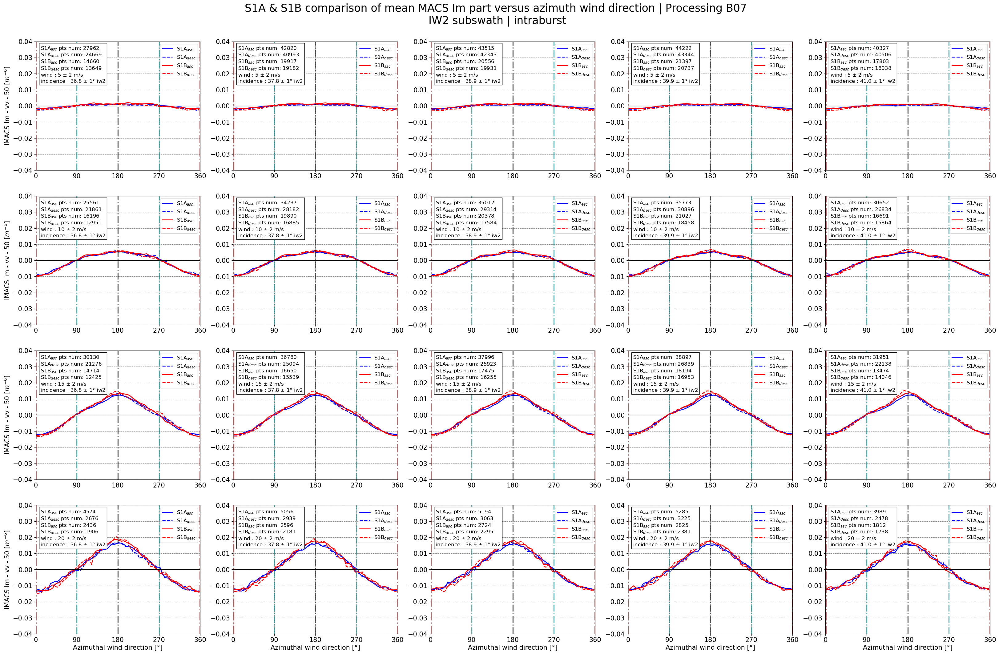

In [29]:
import l1canalysis.utils
reload(l1canalysis.utils)
import l1canalysis.MACS_figures.plot_MACS_azimuth_modulation
reload(l1canalysis.MACS_figures.plot_MACS_azimuth_modulation)

l1canalysis.MACS_figures.plot_MACS_azimuth_modulation.asc_desc_imacs_azi_modulation(dfs,subswath="iw2",lambda_val='50',part="Im",
                                                                                           burstkind=burst_family)

## 3.3) IW3 

### 3.3.1) With std

INFO:root:config path: /home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/config.yml


Ploting time : 6.541880130767822 s


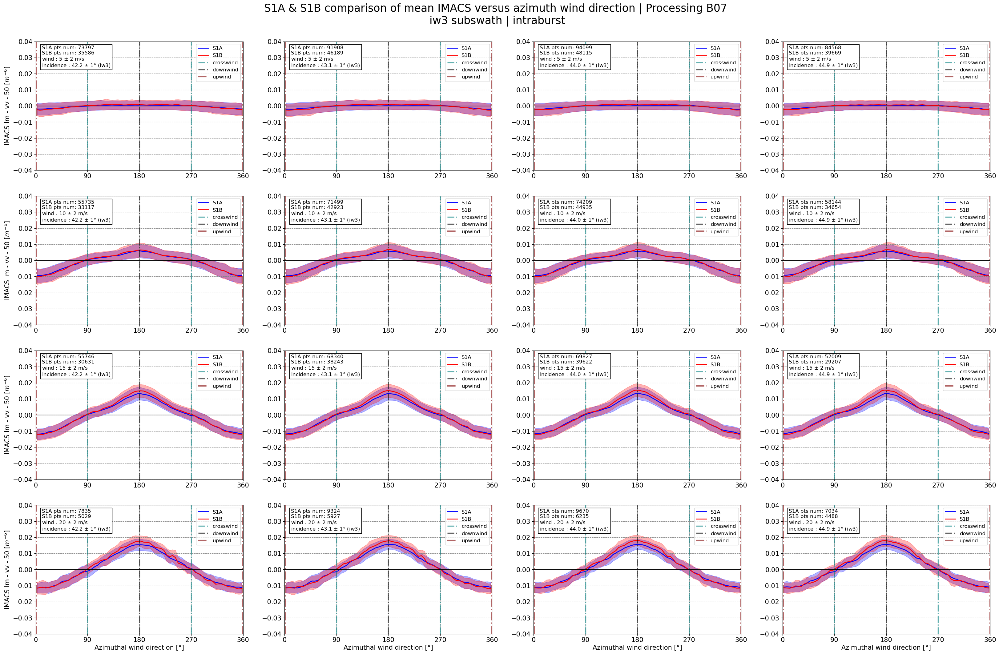

In [32]:
import l1canalysis.utils
reload(l1canalysis.utils)
import l1canalysis.MACS_figures.plot_MACS_azimuth_modulation
reload(l1canalysis.MACS_figures.plot_MACS_azimuth_modulation)

l1canalysis.MACS_figures.plot_MACS_azimuth_modulation.macs_azimutal_modulation_with_std(dfs,subswath="iw3",lambda_val='50',part="Im",
                                                                                           burstkind=burst_family)


### 3.3.2) With ascending/descending filter

INFO:root:config path: /home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/config.yml


Ploting time : 8.509687900543213 s


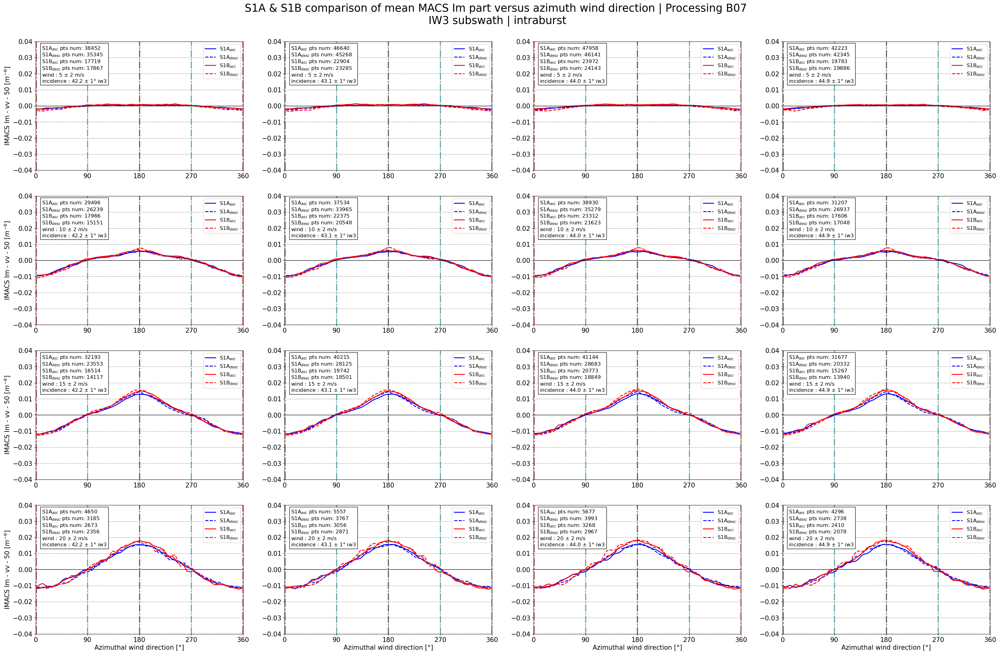

In [33]:
import l1canalysis.utils
reload(l1canalysis.utils)
import l1canalysis.MACS_figures.plot_MACS_azimuth_modulation
reload(l1canalysis.MACS_figures.plot_MACS_azimuth_modulation)

l1canalysis.MACS_figures.plot_MACS_azimuth_modulation.asc_desc_imacs_azi_modulation(dfs,subswath="iw3",lambda_val='50',part="Im",
                                                                                           burstkind=burst_family)

# 4) Merging S1A & S1B dataframes

### 4.3) IMACS Vs azimuth for all winds, filtered by incidence 

INFO:root:config path: /home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/config.yml


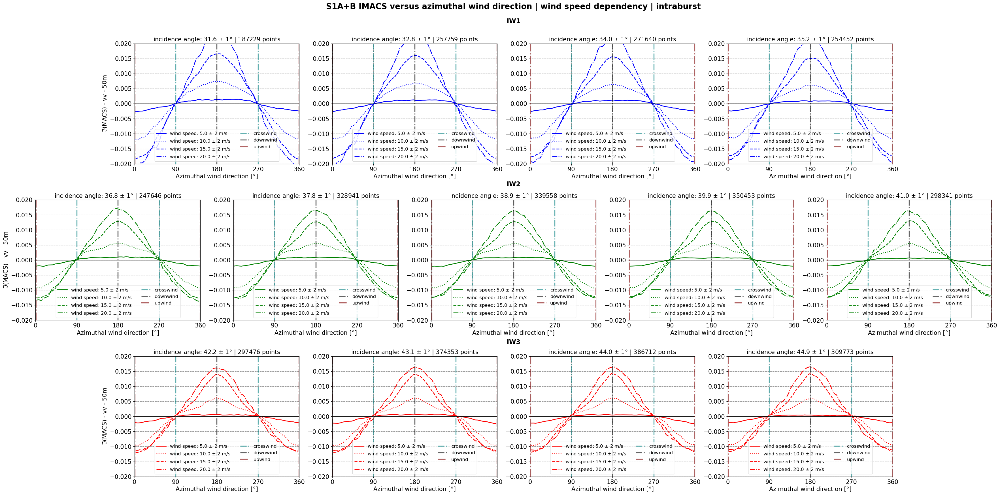

In [29]:
import l1canalysis.utils
reload(l1canalysis.utils)
import l1canalysis.MACS_figures.plot_MACS_azimuth_modulation
reload(l1canalysis.MACS_figures.plot_MACS_azimuth_modulation)

l1canalysis.MACS_figures.plot_MACS_azimuth_modulation.macs_per_subswath_per_windspeed(df_s1,lambda_val='50',part="Im",
                                                                                           burstkind=burst_family)

### 4.4) IMACS filtered by azimuth and wind 

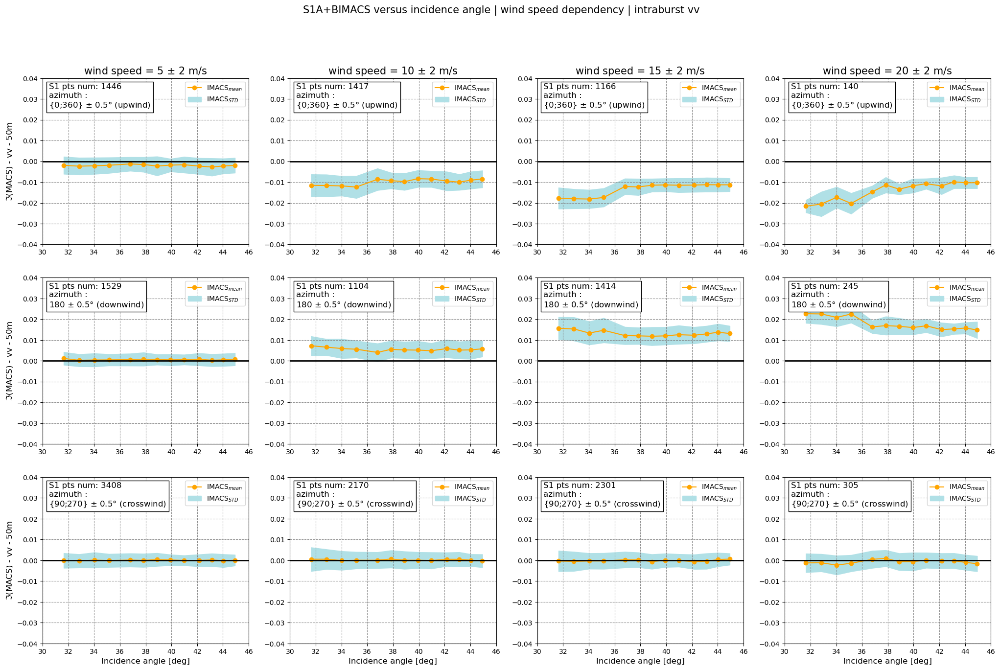

In [16]:
# cell below reproduced with method macs_wrt_incidence_up_down_cross_wind
import l1canalysis.MACS_figures.plot_MACS_wrt_incidence
reload(l1canalysis.MACS_figures.plot_MACS_wrt_incidence)
l1canalysis.MACS_figures.plot_MACS_wrt_incidence.macs_wrt_incidence_up_down_cross_wind(df_s1a,
                                            satellite='S1A+B',part='Im',burstkind='intraburst',polarization='vv',lambda_val='50')

/home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/MACS_figures/plot_MACS_wrt_incidence.py:329: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown


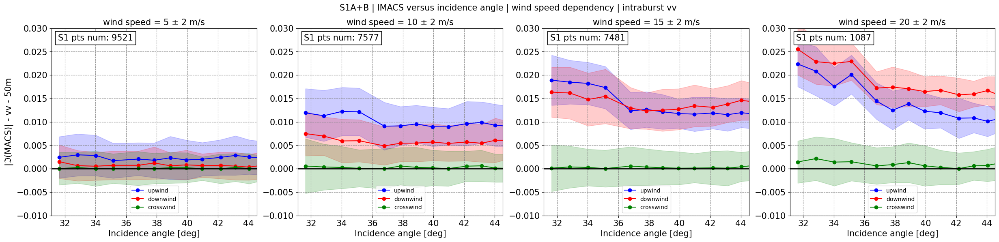

In [18]:
import l1canalysis.MACS_figures.plot_MACS_wrt_incidence
reload(l1canalysis.MACS_figures.plot_MACS_wrt_incidence)
l1canalysis.MACS_figures.plot_MACS_wrt_incidence.macs_wrt_incidence_recap(df_s1,satellite='S1A+B',part='Im',
                                                                          burstkind='intraburst',polarization='vv',lambda_val='50')


### 4.5) map IMACS where wind > 18 m/s

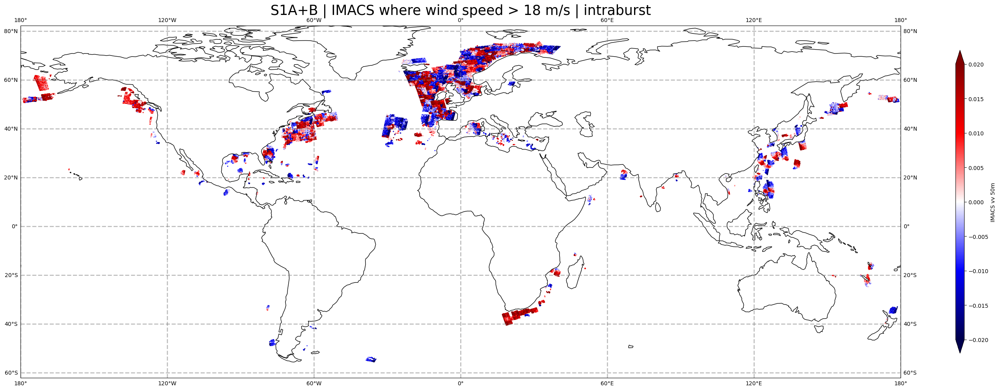

In [34]:
import l1canalysis.MACS_figures.plot_MACS_map
reload(l1canalysis.MACS_figures.plot_MACS_map)
# for uu in df_s1:
#     print(uu)
l1canalysis.MACS_figures.plot_MACS_map.map_macs_scatter(df_s1,satellite='S1A+B',part='Im',burstkind='intraburst',polarization='vv',lambda_val='50')

INFO:root:config path: /home1/datahome/agrouaze/sources/git/L1C-XSP_IMACS-analysis/l1canalysis/config.yml


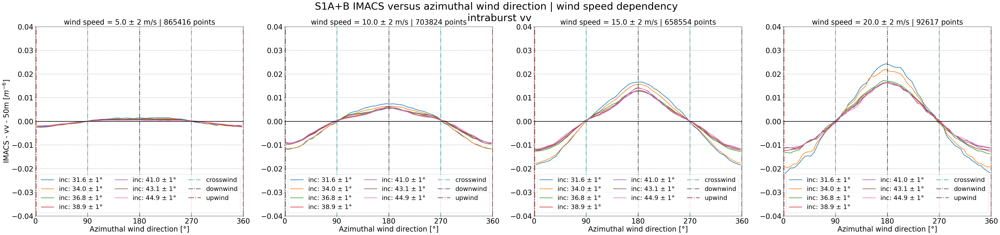

In [25]:
import l1canalysis.utils
reload(l1canalysis.utils)
import l1canalysis.MACS_figures.plot_MACS_azimuth_modulation
reload(l1canalysis.MACS_figures.plot_MACS_azimuth_modulation)

l1canalysis.MACS_figures.plot_MACS_azimuth_modulation.macs_az_windspeed_inc_recap(df_s1,satellite='S1A+B',part='Im',
                                                                    burstkind='intraburst',polarization='vv',lambda_val='50')